# Contents
* [Intro](#Intro)
* [Imports and config](#Imports-and-config)
* [Load data](#Load-data)
  * [Undersample data](#Undersample-data)
* [Methods 1 and 2](#Methods-1-and-2)
* [Examine results](#Examine-results)
* [Pad with initial silence](#Pad-with-initial-silence)
* [Conclusion](#Conclusion)

## Intro

Having previously divided the data into sets of short, medium, and long duration, we still need to find a way to make duration uniform within each set. In this notebook, we will compare three methods of fixing sample durations:

1. Extract mel-scale spectrogram and shrink/stretch.
1. Shrink/stretch audio and extract mel-scale spectrogram.
1. Pad beginning of audio with silence and extract mel-scale spectrograms.

We will see that there is little difference in the output of the first two methods, but a lot of audio quality is lost either way. The third method does not distort or truncate any audio at the cost of inserting artificial silence at the beginning of the sample.

## Imports and config

In [1]:
# Core
from os import listdir
import numpy as np
import pandas as pd
import librosa

# Image manipulation
import skimage.io
import cv2

# Playback
import IPython.display as ipd

# Vis
import matplotlib.pyplot as plt
import librosa.display
import matplotlib.image as mpimg

In [2]:
# Display
%matplotlib inline

# display outputs w/o print calls
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

In [3]:
SEED = 2021

# Location of medium.pkl, which contains the samples of medium duration
PICKLED_DF_FOLDER = "../1.0-mic-divide_data_by_duration"

# Location where this notebook will output spectrogram PNGs
DATA_OUT_FOLDER = "."

# The preprocessed data from the Unified Multilingual Dataset of Emotional Human utterances
WAV_DIRECTORY = (
    "../unified_multilingual_dataset_of_emotional_human_utterances/data/preprocessed"
)

In [4]:
# Extensions
# %load_ext lab_black
# %load_ext blackcellmagic
# %load_ext nb_black
# %load_ext ipycache

## Load data

In [5]:
medium_df = pd.read_pickle(f"{PICKLED_DF_FOLDER}/medium.pkl")
medium_df.head()

,file,duration,source,speaker_id,speaker_gender,emo,valence,lang1,lang2,neg,neu,pos,length
id,,,,,,,,,,,,,
00000,00000+aesdd+aesdd.1+f+ang+-1+ell+el-gr.wav,4.129,aesdd,aesdd.1,f,ang,-1,ell,el-gr,1,0,0,medium
00001,00001+aesdd+aesdd.2+f+ang+-1+ell+el-gr.wav,3.448,aesdd,aesdd.2,f,ang,-1,ell,el-gr,1,0,0,medium
00002,00002+aesdd+aesdd.3+m+ang+-1+ell+el-gr.wav,3.980,aesdd,aesdd.3,m,ang,-1,ell,el-gr,1,0,0,medium
00003,00003+aesdd+aesdd.4+m+ang+-1+ell+el-gr.wav,3.390,aesdd,aesdd.4,m,ang,-1,ell,el-gr,1,0,0,medium
00004,00004+aesdd+aesdd.5+f+ang+-1+ell+el-gr.wav,4.042,aesdd,aesdd.5,f,ang,-1,ell,el-gr,1,0,0,medium


### Undersample data

We're just testing out some transformations so we only need enough data to see if things work. Let's grab 1 sample from each data source.

In [6]:
sample_df = medium_df.groupby("source").sample(n=1, random_state=SEED)
len(medium_df)
len(sample_df)
np.unique(medium_df.source) == np.unique(sample_df.source)
sample_df

81099

27

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

,file,duration,source,speaker_id,speaker_gender,emo,valence,lang1,lang2,neg,neu,pos,length
id,,,,,,,,,,,,,
01392,01392+BAUM1+BAUM1.s019+f+neu+0+tur+tr-tr.wav,3.821000,BAUM1,BAUM1.s019,f,neu,0,tur,tr-tr,0,1,0,medium
01937,01937+BAUM2+BAUM2.S032+m+ang+-1+eng+en.wav,1.835000,BAUM2,BAUM2.S032,m,ang,-1,eng,en,1,0,0,medium
05196,05196+CREMA-D+CREMA-D.1053+f+fea+-1+eng+en-us.wav,1.925000,CREMA-D,CREMA-D.1053,f,fea,-1,eng,en-us,1,0,0,medium
54944,54944+EYASE+EYASE.Female01+f+hap+1+arz+ar-eg.wav,1.059000,EYASE,EYASE.Female01,f,hap,1,arz,ar-eg,0,0,1,medium
11409,11409+EmoDB+EmoDB.16+f+bor+-1+deu+de-de.wav,2.081000,EmoDB,EmoDB.16,f,bor,-1,deu,de-de,1,0,0,medium
11952,11952+EmoReact_V_1.0+EmoReact_V_1.0.test13+m+u...,3.702000,EmoReact_V_1.0,EmoReact_V_1.0.test13,m,unk,1,eng,en,0,0,1,medium
14095,14095+EmoV-DB_sorted+EmoV-DB_sorted.bea+f+neu+...,4.198000,EmoV-DB_sorted,EmoV-DB_sorted.bea,f,neu,0,eng,en-us,0,1,0,medium
12635,12635+Emotional_EMA+Emotional_EMA.joy+f+ang+-1...,4.945000,Emotional_EMA,Emotional_EMA.joy,f,ang,-1,eng,en-us,1,0,0,medium
57117,57117+LEGOv2+LEGOv2.20061123)022+m+ang+-1+eng+...,3.681938,LEGOv2,LEGOv2.20061123)022,m,ang,-1,eng,en-us,1,0,0,medium


## Methods 1 and 2

First, we will obtain the median duration in seconds. Ostensibly, we can shrink or stretch to the median duration so no single sample needs to stretch/shrink much more than the rest.

In [7]:
median_duration_seconds = sample_df.duration.median()
if (
    len(median_sample := sample_df.loc[sample_df.duration == median_duration_seconds])
    > 1
):
    print(">1 median values by seconds")
else:
    print(
        f"median sample is {median_sample.file[0]} at {median_sample.duration[0]} seconds."
    )

median sample is 86150+urdu+urdu.SM25+m+sad+-1+urd+ur.wav at 3.004 seconds.


Next, let's generate spectrograms for the undersampled files. We will define two helper functions in the next cell to assist in this process. In addition, we will define two dictionaries we will use to help us track whether a sample was stretched/shrunk.

In [8]:
def get_mspectrogram(
    utterance=None, file="", folder=".", title="", suppress=False
) -> np.array:
    if file:
        spec = librosa.amplitude_to_db(
            librosa.feature.melspectrogram(
                y=librosa.load(path=f"{folder}/{file}", sr=16000, mono=False)[0],
                sr=16000,
            ),
            ref=np.max,
        )
    elif utterance is not None:
        spec = librosa.amplitude_to_db(
            librosa.feature.melspectrogram(y=utterance, sr=16000), ref=np.max
        )
    else:
        return None
    if not suppress:
        librosa.display.specshow(spec, sr=16000, x_axis="time", y_axis="mel")
        plt.colorbar(format="%+2.0f dB")
        plt.show()
        if title:
            plt.suptitle(title)
        else:
            plt.suptitle(file)
    return spec

def write_spectro(spectro, filename: str, folder=".", add_png=True) -> None:
    if add_png:
        skimage.io.imsave(f"{folder}/{filename}.png", spectro)
    else:
        skimage.io.imsave(f"{folder}/{filename}", spectro)
        
shrink_or_expand1, shrink_or_expand2 = {}, {}

In [9]:
for file_ in sample_df.file:
    loaded = librosa.load(path=f"{WAV_DIRECTORY}/{file_}", sr=16000, mono=False)[0]
    # write spectro img
    write_spectro(
        get_mspectrogram(loaded, suppress=True),
        filename=file_,
        folder=(ragged_folder := f"{DATA_OUT_FOLDER}/ragged_spectrograms"),
    )

Lossy conversion from float32 to uint8. Range [-79.99999237060547, 7.62939453125e-06]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.00000762939453, -7.62939453125e-06]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.0, 3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-80.0, 0

Now that we have spectrograms, we can obtain the median duration in pixels too.

In [10]:
median_duration_px = int(
    np.median(
        px_durations := [
            skimage.io.imread(f"{ragged_folder}/{ragged_spec_img}").shape[1]
            for ragged_spec_img in listdir(ragged_folder)
        ]
    )
)

if px_durations.count(median_duration_px) > 1:
    # This happens when two files are close enough in duration they come out the the same width in pixels
    print("multiple median samples by px duration")

multiple median samples by px duration


Now that we have the median in seconds and in pixels, we can stretch/shrink the audio and spectrograms. In the cell below, we define two helper functions to assist in stretching/shrinking. In the following cell, we loop through the samples again and save the new spectrograms, which should all have the same duration.

In [11]:
def resize_ragged_img(imagename: str, folder="."):
    img = skimage.io.imread(f"{folder}/{imagename}.png")
    if (dim := img.shape[1]) < median_duration_px:
        shrink_or_expand1[imagename] = "expand"
        return cv2.resize(
            img, dsize=(median_duration_px, 128), interpolation=cv2.INTER_LINEAR_EXACT
        )
    elif dim > median_duration_px:
        shrink_or_expand1[imagename] = "shrink"
        return cv2.resize(
            img, dsize=(median_duration_px, 128), interpolation=cv2.INTER_CUBIC
        )
    else:
        shrink_or_expand1[imagename] = "median"
        print("median", imagename)
        return img


def resize_ragged_audio(loaded, wavname):
    return_me = librosa.effects.time_stretch(
        loaded,
        rate=(duration := librosa.get_duration(y=loaded, sr=16000))
        / median_duration_seconds,
    )
    if duration < median_duration_seconds:
        shrink_or_expand2[wavname] = "expand"
    elif duration > median_duration_seconds:
        shrink_or_expand2[wavname] = "shrink"
    else:
        shrink_or_expand2[wavname] = "median"
    return return_me

In [12]:
for file_ in sample_df.file:
    loaded = librosa.load(path=f"{WAV_DIRECTORY}/{file_}", sr=16000, mono=False)[0]
    # The next line (playback) doesn't work from within VS Code, but works fine from within the browser notebook
    ipd.Audio(data=loaded, rate=16000)
    
    # write resized img spectro
    write_spectro(
        resize_ragged_img(file_, folder=ragged_folder),
        file_,
        folder=f"{DATA_OUT_FOLDER}/resized_spectrograms",
    )
    
    # write resized audio spectro
    write_spectro(
        get_mspectrogram(resize_ragged_audio(loaded, file_), suppress=True),
        filename=file_,
        folder=f"{DATA_OUT_FOLDER}/preresized_spectrograms",
    )

Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.00000762939453, -7.62939453125e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, -3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-79.99999237060547, 7.62939453125e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, -1.9073486328125e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, -3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


median 10067+dzafic+dzafic.0+f+ang+-1+eng+en-au.wav


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 3.814697265625e-06]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


median 86150+urdu+urdu.SM25+m+sad+-1+urd+ur.wav


Lossy conversion from float32 to uint8. Range [-80.0, 0.0]. Convert image to uint8 prior to saving to suppress this warning.


## Examine results

In this section, we will load up the fixed-length spectrograms we created in the previous section to see how we did.

In [13]:
resized = listdir(resized_folder := f"{DATA_OUT_FOLDER}/resized_spectrograms")
preresized = listdir(preresized_folder := f"{DATA_OUT_FOLDER}/preresized_spectrograms")

In [14]:
# There are two median samples when considering duration in terms of pixels
if shrink_or_expand1.keys() == shrink_or_expand2.keys():
    for key in shrink_or_expand1.keys():
        if shrink_or_expand1[key] == shrink_or_expand2[key]:
            continue
        print(key, shrink_or_expand1[key], shrink_or_expand2[key])
else:
    print("keys are different!")

10067+dzafic+dzafic.0+f+ang+-1+eng+en-au.wav median expand


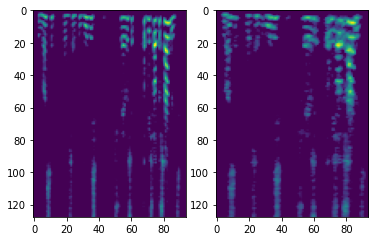

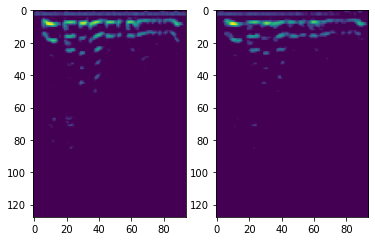

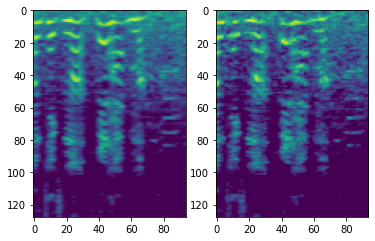

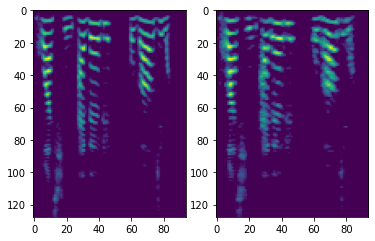

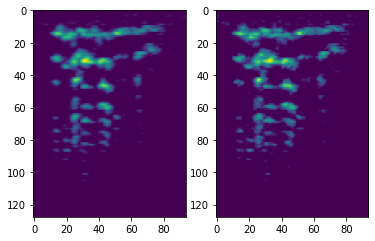

...

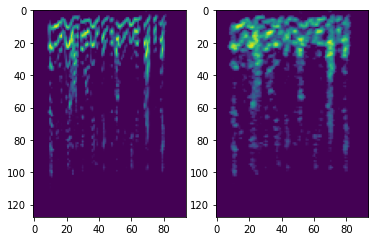

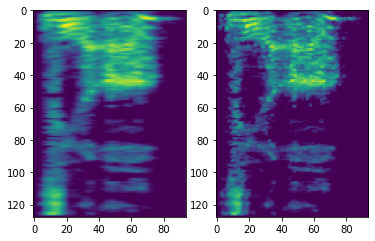

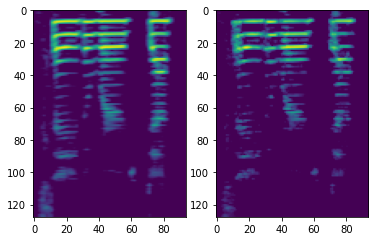

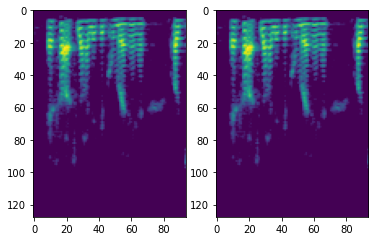

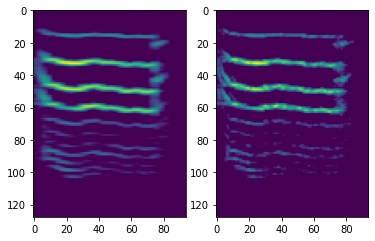

In [15]:
for img1, img2 in zip(resized, preresized):

    img_A = mpimg.imread(f"{resized_folder}/{img1}")
    img_B = mpimg.imread(f"{preresized_folder}/{img2}")

    # display images
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(img_A)
    ax[1].imshow(img_B)
    plt.show()
    
    ipd.Audio(data=librosa.feature.inverse.mel_to_audio(img_A), rate=16000)
    ipd.Audio(data=librosa.feature.inverse.mel_to_audio(img_B), rate=16000)
    

These look pretty similar (although clearly not identical), but they all sound horrible! Clearly some audio quality is being lost through all these manipulations. Whether to stretch the sample before or after exporting the spectrogram has become a secondary concern.

## Pad with initial silence

Stretching/shrinking is introducing more distortion than I am comfortable with; the reconstructed files were barely recognizable as human utterances.

Instead, I am choosing to pad with initial silence. Padding does not add in new information; it just adds in artificial silence. Padding does not distort the signal since there is no stretch or shrink. We pad on the left side since the silence on the right side may potentially be meaningful.

In [16]:
loaded = [
    librosa.load(path=f"{WAV_DIRECTORY}/{file_}", sr=16000, mono=False)[0]
    for file_ in sample_df.file
]
max_len = max(len(_) for _ in loaded)
padded = [np.pad(_, (max_len - len(_), 0), mode="constant", constant_values=0) for _ in loaded]
len(loaded) == len(padded)
all([len(_) == max_len for _ in padded])

True

True

Finally, let's save our new spectrograms and take a look at them.

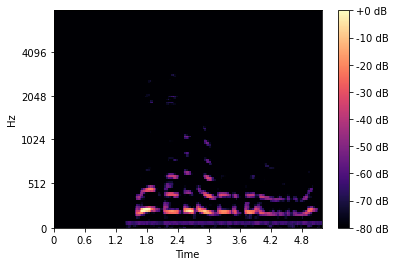

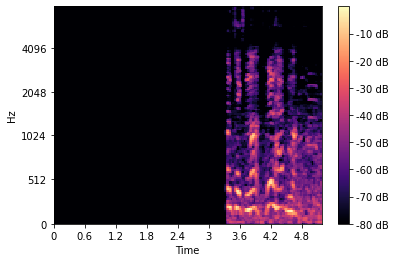

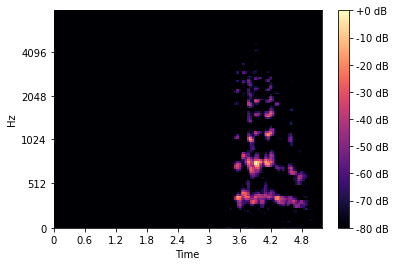

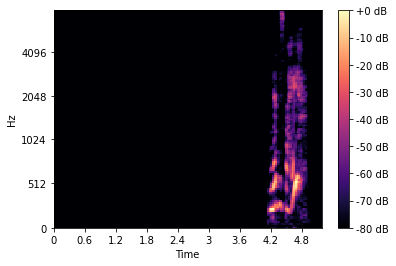

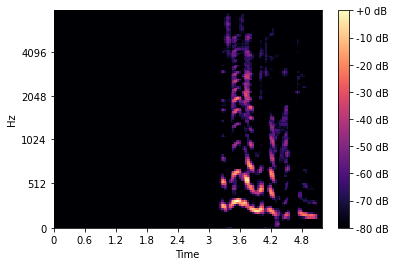

...

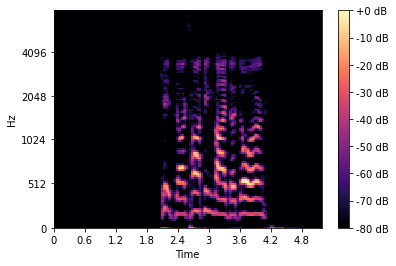

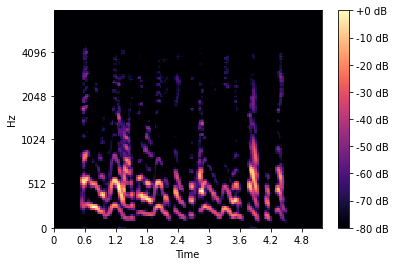

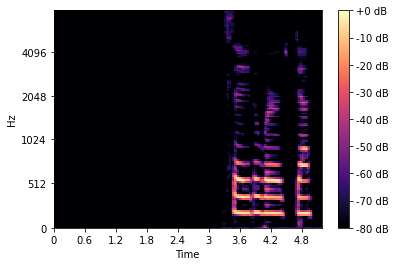

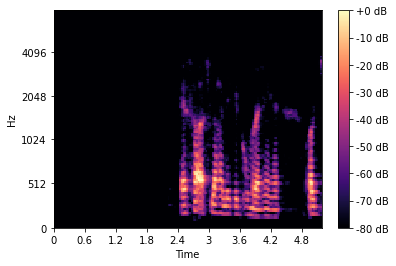

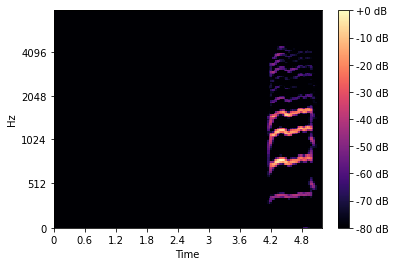

In [17]:
for loaded_and_padded, file_ in zip(padded, sample_df.file):
    spec = librosa.amplitude_to_db(
            librosa.feature.melspectrogram(y=loaded_and_padded, sr=16000), ref=np.max
        )
    librosa.display.specshow(spec, sr=16000)
    plt.savefig(f"padded_spectrograms/{file_}.png")
    librosa.display.specshow(spec, sr=16000, x_axis="time", y_axis="mel")
    plt.colorbar(format="%+2.0f dB")
    ipd.Audio(loaded_and_padded, rate=16000)
    plt.show()
    

## Conclusion

In this notebook, we explored three ways of setting sample durations to a fixed length. The first two methods involved stretching or shrinking samples to the median duration within the set. Neither yielded satisfactory results as the audio signals became too distorted to be intelligible; as a result, whether to extract spectrograms before or after setting duration became a moot point.

Instead, we padded each sample with initial silence up to the maximum duration within the set. This approach avoids truncating or distorting information at the cost of artificial silence. The beginning rather than the end was padded to preserve any potential signal in the trailing silences.

[^top](#Contents)